(3) **[Challenge] Computational project.** To treat the dynamics of BECs, we need the time-dependent GPE,

$$
i\hbar \frac{\partial \psi(r,t)}{\partial t} = -\frac{\hbar^2}{2m} \nabla^2 \psi(r,t) + V(r)\psi(r,t) + U_0 |\psi(r,t)|^2 \psi(r,t).
$$

Studying the dynamics of interacting systems is challenging. Fortunately, we can employ numerical methods to investigate these systems.

First, let us consider the one-dimensional non-interacting case. The dimensionless equation we wish to solve is:

$$
H \psi(x,t) = i \frac{\partial \psi(x,t)}{\partial t}
$$
with
$$
H = -\frac{1}{2} \frac{\partial^2 \psi}{\partial x^2} + V(x).
$$

When solving problems analytically, we obtain $ \psi(x,t) $ in the continuum of position and time. Here, we will adopt a different approach, which is better suited to handle this problem numerically. We begin by discretizing our spatial and temporal domains, i.e., we consider $ \psi(x_i, t_j) $ with equally-spaced points in space and time, $ x_i = i \Delta x $ and $ t_j = j \Delta t $ (integer $ i $ and $ j $).

Visscher proposed the algorithm for the temporal evolution we will employ in this project (see the suggested bibliography). We write explicitly the real and imaginary parts of the wave function: $ \psi(x,t) = R(x,t) + i I(x,t) $. Substituting it into the time-dependent Schrödinger equation, we obtain two equations:

$$
\frac{dR}{dt} = H I,
$$

$$
\frac{dI}{dt} = -H R.
$$


Instead of computing both the real and imaginary parts at the same time $t$, we calculate $R$ at $t = 0, \Delta t, 2 \Delta t, \dots$ and $I$ at $t = \Delta t / 2, 3 \Delta t / 2, 5 \Delta t / 2, \dots$ Their time-evolution is given by:

$$
R\left(x, t + \frac{\Delta t}{2}\right) = R\left(x, t - \frac{\Delta t}{2}\right) + \Delta t H I(x,t),
$$
$$
I\left(x, t + \frac{\Delta t}{2}\right) = I\left(x, t - \frac{\Delta t}{2}\right) - \Delta t H R(x,t).
$$

To start the algorithm, we need $R(x, 0)$ (which comes from the initial conditions) and $I(x, \Delta t / 2)$, which can be obtained by performing a “half step”:

$$
I\left(x, \frac{\Delta t}{2}\right) = I(x, 0) - HR(x, 0) \frac{\Delta t}{2}.
$$

Equations (11) to (13) contain the kinetic operator applied to the real and imaginary parts of the wave function. The second spatial derivative of a discretized function can be calculated using:

$$
\frac{\partial^2 f(x_i, t_j)}{\partial x^2} \approx \frac{ \left[ f(x_{i+1}, t_j) - 2f(x_i, t_j) + f(x_{i-1}, t_j) \right]}{(\Delta x)^2}.
$$

The probability density is not obvious in this case since we are computing the real and imaginary components of the wave function at different time instants. We have two alternatives:

$$
P(x,t) = R(x,t)^2 + I(x,t + \Delta t/2)I(x,t - \Delta t/2),
$$

$$
P(x,t) = R(x,t + \Delta t/2)R(x,t - \Delta t/2) + I(x,t)^2.
$$

Finally, we have to check if the values we choose for $\Delta x$ and $\Delta t$ provide a stable evolution. The stability criterion is given by:


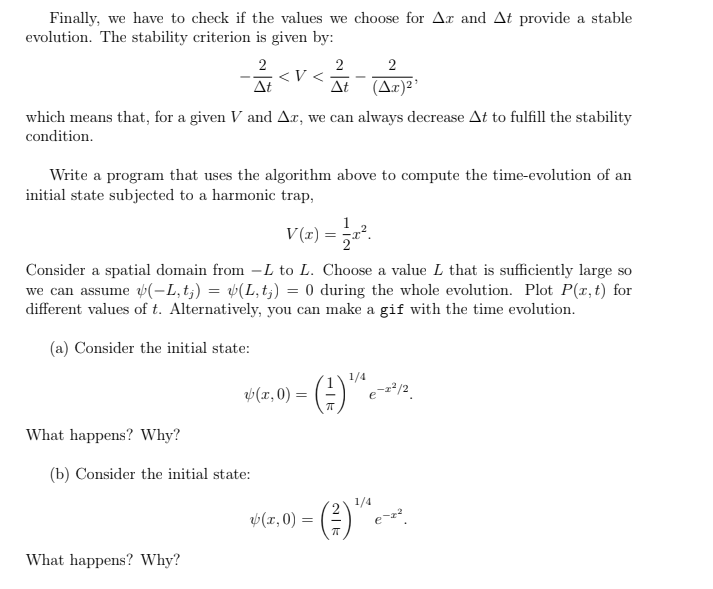

## Solution:

As always, let's install and import the necesary libraries:

In [ ]:
!pip install numpy #Its to compute
!pip install numba #Numba its a jit compilator
!pip install matplotlib #matplotlib for plotting issues

In [1]:
#Simulation Parameters:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

from IPython.display import HTML
from numba import njit, vectorize
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rcParams


Once the table is ready to cook, let's combine the ingredients part by part!

The first, that we need, is to define the different operators. Given that we will encode the information in a discretized 1D Vector, It is possible to `vectorize` ours functions with the numba library! make it possible to run simulations in a much faster way! This is important in order to obtain Feasable realized solutions in a window of time that we can utilize.

Once this stated, let's start our solution:

1) First, for our Hamiltonian operator, it is necesary to implement the laplacian operator and the potential multiplication. For the laplacian, we will shift the vector that we are applying this operator by $\pm 1$ and impose Dirichlet Boundary Conditions, i.e., if we are counting from 0 to N-1, then the value of the entries $f_{N} = f_{-1} = 0$. This will erase the pathological cases at the definition of our laplacian.

Once this is done, we will vectorize the Hamiltonian function. This is achieved by encoding our function as how it should be applied to every entry of the wavefunction vector:

In [2]:
#This operator gives us the necessary tools
#to compute the laplacian. f_{n - 1}, f_{n + 1} and f_{n}
@njit
def rolled_vector(f):
  fx1 = f

  fxplus1 = np.roll(f, 1)
  fxplus1[0] = 0

  fxminus1 = np.roll(f, -1)
  fxminus1[-1] = 0

  return fxminus1, fx1, fxplus1

@vectorize
def Hamiltonian_Op(fxm1, fx, fxp1, V, dx):
  #first we make the kinetic part:
  lap = (fxm1 + fxp1 - 2 * fx) / (dx * dx)
  Kterm = -0.5 * lap
  #now the Potential Term
  Vterm = V * fx
  return Kterm + Vterm

Now, let's prepare the potential to utilize, the simulation parameters and the stability condition:

Just to clarify, in the original paper it is stated that the stability condition is only applied for any choose of potential. Here we will stick to the highest possible acurracy of the simulation:


In [3]:
@njit
def stability_criteria_of_dt(V, dx):
    Vmax = max(V)

    numerator = -2 * dx * dx
    denominator = -2 + dx * dx * Vmax

    dt = numerator / denominator 

    order = np.floor(np.log10(dt))
    # Scale and round down to one significant figure
    dt = np.floor(dt / (10** order)) * (10** order)
    
    return dt * 1e-1


@vectorize
def Rnew(Rold, Itm1, It, Itp1, V, dt, dx):
  nd_term = dt * Hamiltonian_Op(Itm1, It, Itp1, V, dx)
  return Rold + nd_term

@vectorize
def Inew(Iold, Rtm1, Rt, Rtp1, V, dt, dx):
  nd_term = dt * Hamiltonian_Op(Rtm1, Rt, Rtp1, V, dx)
  return Iold - nd_term

@njit
def NonInteracting_simulation(L, dx, Ntimesteps):
   
    X = np.arange(-L, L, dx) #the discretized X-space
    V = X * X * 0.5 # we generate our armonic potential

    #given the potential and the dx
    #we generate our stable dt
    dt = stability_criteria_of_dt(V, dx) 
    tfinal = Ntimesteps * dt
    T = np.arange(0, tfinal, dt * 0.5) # our discretized timespace, by jumps of dt/2

    #part a) Initial conditions:
    R = np.exp(-0.5 * X * X) * (1 / np.pi) ** 0.25
    I = np.zeros_like(R)

    #2nd step: the first half step of the simulation:
    Rm1, R, Rp1 = rolled_vector(R)
    I = I - Hamiltonian_Op(Rm1, R, Rp1, V, dx) * dt * 0.5

    #Now we generate the lists to store our data:
    Prob_list = np.zeros(shape= ( len(T), len(X)))
    R_list = np.zeros_like(Prob_list)
    I_list = np.zeros_like(Prob_list)

    #and add the initial coonditions
    Prob_list[0][:] = R * R
    R_list[0][:] = R
    I_list[0][:] = I

    #now we begin the iterations, how we are making increments of half
    #steps, our T = [0, dt/2, dt, 3dt/2, ...] and we already do the first one,
    #we will start from T[2:] ...
    for i in range(2, len(T[2:])):
       
       #if the time is integer:
        if i % 2 == 0:
            Im1, I, Ip1 = rolled_vector(I)
            Rstep = Rnew(R, Im1, I, Ip1, V, dt, dx)
            
            #we compute the Probability for integer time
            prob = Rstep * R + I * I
            R = Rstep

        #if our time is half integer:
        else:
            Rm1, R, Rp1 = rolled_vector(R)
            Istep = Inew(I, Rm1, R, Rp1, V, dt, dx)
            
            #we compute the Probability for half integer
            prob = Istep * I + R * R
            I = Istep

        #we save the data
        Prob_list[i+1][:] = prob
        R_list[i][:] = R
        I_list[i][:] = I


    return [Prob_list, R_list, I_list]

          

Now, we will generate the time evolution of our Real and Imaginary part of our wavefunction as it follows

In [4]:
# Simulation parameters, feel free to change it!

L = 12
dx = 0.1
Ntimesteps = 2 ** 14

ydata = NonInteracting_simulation(L, dx, Ntimesteps)



In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib import rcParams

# Aumenta el límite de tamaño de la animación incrustada a, por ejemplo, 100 MB
rcParams['animation.embed_limit'] = 50

X = np.arange(-L, L, dx) #the discretized X-space
V = X * X * 0.5 # we generate our armonic potential

#here in order to plot more smoothly,
#we will only consider frames

#the [::5] cond is to plot it more smoothly
data = ydata
data1 = data[0][::6]
data2 = data[1][::6]
data3 = data[2][::6]


x_values =  X# Los valores en el eje X (espacio)

# 2. Crear la figura y un solo eje
fig, ax = plt.subplots(figsize=(6, 4))  # Solo un gráfico

# Inicialmente graficamos los primeros frames de los tres conjuntos de datos
line = ax.plot(X, V, label= r'$V(x) = \frac{1}{2}x^2$')
line1, = ax.plot(x_values, data1[0], color='b', label= r'$|\psi|²$')
line2, = ax.plot(x_values, data2[0], color='r', label= r'$\Re(\psi)$')
line3, = ax.plot(x_values, data3[0], color='g', label= r'$\Im(\psi)$' )

# 3. Ajustamos los ejes, agregamos etiquetas, título y grid
ax.set_xlim(-L, L)
ax.set_ylim(-1, 1)
ax.set_xlabel('X')
ax.set_ylabel('Amplitude ')
ax.set_title('Time evolution of the system')
ax.grid(True)
ax.legend(loc= 4)  # Mostrar la leyenda para las tres funciones

# Añadir texto para mostrar el instante de tiempo
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)

# 4. Función de actualización para la animación
def update(frame):
    line1.set_ydata(data1[frame])  # Actualizamos los datos de la primera línea
    line2.set_ydata(data2[frame])  # Actualizamos los datos de la segunda línea
    line3.set_ydata(data3[frame])  # Actualizamos los datos de la tercera línea

    time_text.set_text(f'iteration: {frame}')  # Actualizar el texto del tiempo

    return line1, line2, line3, time_text  # Retornamos el texto junto con las líneas

# 5. Crear la animación
ani = FuncAnimation(fig, update, frames= int(Ntimesteps/15), blit=True)

# 6. Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())

As we can observe, our wavefunction stays stable. This is due to the fact that the initial conditions in this case corresponds to an eigenfunction of the potential that we are treating! for further research, you can change the parameters to see how numerical errors arises!

## Part b
Lets do the same, but now with a different initial condition!

In [8]:
@njit
def NonInteracting_simulation_part_b(L, dx, Ntimesteps):
   
    X = np.arange(-L, L, dx) #the discretized X-space
    V = X * X * 0.5 # we generate our armonic potential

    #given the potential and the dx
    #we generate our stable dt
    dt = stability_criteria_of_dt(V, dx) 
    tfinal = Ntimesteps * dt
    T = np.arange(0, tfinal, dt * 0.5) # our discretized timespace, by jumps of dt/2

    #part b) Initial conditions:
    R = np.exp(-X * X) * (2 / np.pi) ** 0.25
    I = np.zeros_like(R)

    #2nd step: the first half step of the simulation:
    Rm1, R, Rp1 = rolled_vector(R)
    I = I - Hamiltonian_Op(Rm1, R, Rp1, V, dx) * dt * 0.5

    #Now we generate the lists to store our data:
    Prob_list = np.zeros(shape= ( len(T), len(X)))
    R_list = np.zeros_like(Prob_list)
    I_list = np.zeros_like(Prob_list)

    #and add the initial coonditions
    Prob_list[0][:] = R * R
    R_list[0][:] = R
    I_list[0][:] = I

    #now we begin the iterations, how we are making increments of half
    #steps, our T = [0, dt/2, dt, 3dt/2, ...] and we already do the first one,
    #we will start from T[2:] ...
    for i in range(1, len(T[2:])):
       
       #if the time is integer:
        if i % 2 == 0:
            Im1, I, Ip1 = rolled_vector(I)
            Rstep = Rnew(R, Im1, I, Ip1, V, dt, dx)
            
            #we compute the Probability for integer time
            prob = Rstep * R + I * I
            R = Rstep

        #if our time is half integer:
        else:
            Rm1, R, Rp1 = rolled_vector(R)
            Istep = Inew(I, Rm1, R, Rp1, V, dt, dx)
            
            #we compute the Probability for half integer
            prob = Istep * I + R * R
            I = Istep

        #we save the data
        Prob_list[i+1][:] = prob
        R_list[i][:] = R
        I_list[i][:] = I


    return [Prob_list, R_list, I_list]

In [9]:
# Simulation parameters, feel free to change it!

L = 12
dx = 0.1
Ntimesteps = 2 ** 14

ydata_part_b = NonInteracting_simulation_part_b(L, dx, Ntimesteps)




Animation size has reached 10499232 bytes, exceeding the limit of 10485760.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


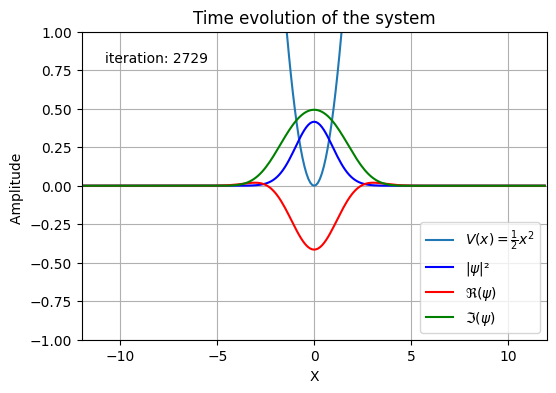

In [10]:
X = np.arange(-L, L, dx) #the discretized X-space
V = X * X * 0.5 # we generate our armonic potential

data = ydata_part_b
data1 = data[0][::6]
data2 = data[1][::6]
data3 = data[2][::6]


x_values =  X# Los valores en el eje X (espacio)

# 2. Crear la figura y un solo eje
fig, ax = plt.subplots(figsize=(6, 4))  # Solo un gráfico

# Inicialmente graficamos los primeros frames de los tres conjuntos de datos
line = ax.plot(X, V, label= r'$V(x) = \frac{1}{2}x^2$')
line1, = ax.plot(x_values, data1[0], color='b', label= r'$|\psi|²$')
line2, = ax.plot(x_values, data2[0], color='r', label= r'$\Re(\psi)$')
line3, = ax.plot(x_values, data3[0], color='g', label= r'$\Im(\psi)$' )

# 3. Ajustamos los ejes, agregamos etiquetas, título y grid
ax.set_xlim(-L, L)
ax.set_ylim(-1, 1)
ax.set_xlabel('X')
ax.set_ylabel('Amplitude ')
ax.set_title('Time evolution of the system')
ax.grid(True)
ax.legend(loc= 4)  # Mostrar la leyenda para las tres funciones

# Añadir texto para mostrar el instante de tiempo
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)

# 4. Función de actualización para la animación
def update(frame):
    line1.set_ydata(data1[frame])  # Actualizamos los datos de la primera línea
    line2.set_ydata(data2[frame])  # Actualizamos los datos de la segunda línea
    line3.set_ydata(data3[frame])  # Actualizamos los datos de la tercera línea

    time_text.set_text(f'iteration: {frame}')  # Actualizar el texto del tiempo

    return line1, line2, line3, time_text  # Retornamos el texto junto con las líneas

# 5. Crear la animación
ani = FuncAnimation(fig, update, frames= int(Ntimesteps / 6), blit=True)

# 6. Mostrar la animación en Google Colab
from IPython.display import HTML
HTML(ani.to_jshtml())

As we can observe here, the probability density starts to oscillate in different modes inside the potential trap. The reason of this is because it is not an eigenfucntion of the system and thus, It will have a dynamical evolution in time.